# Data Description :-

Flight delays are obviously frustrating to air travellers and costly to airlines. Airline companies are the most important customers of the airport. A well-known phrase ‘the airplane earns only when flying’ holds true. On-time performance of airlines schedule is a key factor in maintaining current customer satisfaction and attracting new ones. Flight schedule of the airport is the key to planning and executing airlines’ operation. With each schedule, the airline defines its daily operations and commits its resources to satisfy its customers’ air travel needs. 

Problem Statement:-

The company is keen to understand the key factors through visualisation that cause the delay and predict the possibility of delay in the future.  

# Importing Necessary Libraries

In [2]:
import numpy as np                          #for numeric computation
import pandas as pd                         #data analysis toolkit
import matplotlib.pyplot as plt             #for simple visualization purpose
%matplotlib inline                          #magic function for notebook use
import seaborn as sns                       #for statistical data visualization
import cufflinks as cf                      #for interactive visualization
cf.go_offline()                             #making cuffing for offline use

UsageError: unrecognized arguments: #magic function for notebook use


# Reading all dataset into Dataframe

In [3]:
ny_train_2016=pd.read_csv('./Train Dataset/train_newyork_2016.csv', error_bad_lines=False,skiprows=7)
ny_train_2017=pd.read_csv('./Train Dataset/train_newyork_2017.csv', error_bad_lines=False,skiprows=7)
df_train_2016=pd.read_csv('./Train Dataset/train_dallasfort_2016.csv', error_bad_lines=False,skiprows=7,usecols=range(17))
df_train_2017=pd.read_csv('./Train Dataset/train_dallasfort_2017.csv', error_bad_lines=False,skiprows=7)

ny_test_2018=pd.read_csv('./Test Dataset/test_ny_2018.csv', error_bad_lines=False,skiprows=7)
df_test_2018=pd.read_csv('./Test Dataset/test_df_2018.csv', error_bad_lines=False,skiprows=7)

# Few Data

In [4]:
ny_train_2016.head() #to see top 5 row's of dataset

,Carrier Code,Date (MM/DD/YYYY),Flight Number,Tail Number,Destination Airport,Scheduled departure time,Actual departure time,Scheduled elapsed time (Minutes),Actual elapsed time (Minutes),Departure delay (Minutes),Wheels-off time,Taxi-Out time (Minutes),Delay Carrier (Minutes),Delay Weather (Minutes),Delay National Aviation System (Minutes),Delay Security (Minutes),Delay Late Aircraft Arrival (Minutes)
0,DL,01/01/2016,189.0,N957AT,DTW,09:05,09:19,129.0,120.0,14.0,09:44,25.0,0.0,0.0,0.0,0.0,0.0
1,DL,01/01/2016,344.0,N979AT,ATL,12:00,11:55,172.0,141.0,-5.0,12:06,11.0,0.0,0.0,0.0,0.0,0.0
2,DL,01/01/2016,583.0,N989AT,DTW,12:30,12:29,125.0,102.0,-1.0,12:39,10.0,0.0,0.0,0.0,0.0,0.0
3,DL,01/01/2016,670.0,N913DE,ATL,17:00,17:05,174.0,152.0,5.0,17:19,14.0,0.0,0.0,0.0,0.0,0.0
4,DL,01/01/2016,715.0,N915DL,MSP,16:15,16:14,198.0,162.0,-1.0,16:28,14.0,0.0,0.0,0.0,0.0,0.0


# Checking Shape of Dataset

In [5]:
print(ny_train_2016.shape)
print(ny_train_2017.shape)
print(df_train_2016.shape)
print(df_train_2017.shape)

print('\n')
print(ny_test_2018.shape)
print(df_test_2018.shape)

(25223, 17)
(23592, 17)
(5528, 17)
(5643, 17)


(23851, 17)
(6933, 17)


# Concatinating all Training Datasets into one

In [6]:
training_data=pd.concat([ny_train_2016,ny_train_2017,df_train_2016,df_train_2017], axis=0)
training_data.head()
print(training_data.shape)

(59986, 17)


# Concatinating all Testing Datasets into one

In [7]:
testing_data=pd.concat([ny_test_2018,df_test_2018], axis=0)
testing_data.head()
print(testing_data.shape)

(30784, 17)


# Checking Null Value i.e, Missing Data

In [8]:
training_data.isnull().sum()
testing_data.isnull().sum()

Carrier Code                                0
Date (MM/DD/YYYY)                           2
Flight Number                               2
Tail Number                                 2
Destination Airport                         2
Scheduled departure time                    2
Actual departure time                       2
Scheduled elapsed time (Minutes)            2
Actual elapsed time (Minutes)               2
Departure delay (Minutes)                   2
Wheels-off time                             2
Taxi-Out time (Minutes)                     2
Delay Carrier (Minutes)                     2
Delay Weather (Minutes)                     2
Delay National Aviation System (Minutes)    2
Delay Security (Minutes)                    2
Delay Late Aircraft Arrival (Minutes)       2
dtype: int64

#### Note : - As we have appx. 5 missing data in each column so we will treat it using Forward Fill method

In [9]:
training_data.fillna(method='ffill', inplace=True)
training_data.isnull().sum()
testing_data.fillna(method='ffill', inplace=True)
testing_data.isnull().sum()

Carrier Code                                0
Date (MM/DD/YYYY)                           0
Flight Number                               0
Tail Number                                 0
Destination Airport                         0
Scheduled departure time                    0
Actual departure time                       0
Scheduled elapsed time (Minutes)            0
Actual elapsed time (Minutes)               0
Departure delay (Minutes)                   0
Wheels-off time                             0
Taxi-Out time (Minutes)                     0
Delay Carrier (Minutes)                     0
Delay Weather (Minutes)                     0
Delay National Aviation System (Minutes)    0
Delay Security (Minutes)                    0
Delay Late Aircraft Arrival (Minutes)       0
dtype: int64

##### Note:- Removing un-neccessary columns which has no importance on delay, according to dataset

In [10]:
training_data_r=training_data.drop(['Flight Number','Tail Number','Scheduled departure time','Actual departure time',
                    'Scheduled elapsed time (Minutes)','Actual elapsed time (Minutes)'],axis=1)
testing_data_r=testing_data.drop(['Flight Number','Tail Number','Scheduled departure time','Actual departure time',
                    'Scheduled elapsed time (Minutes)','Actual elapsed time (Minutes)'], axis=1)

In [11]:
print(training_data_r.shape)
print(testing_data_r.shape)

(59986, 11)
(30784, 11)


##### Creating extra fetures i.e, Date(Month,Year,Day of Week)

In [12]:
training_data_r['Date (MM/DD/YYYY)'] = pd.to_datetime(training_data_r['Date (MM/DD/YYYY)'])
training_data_r['Year'] = training_data_r['Date (MM/DD/YYYY)'].dt.year 
training_data_r['Month'] = training_data_r['Date (MM/DD/YYYY)'].dt.month 
training_data_r['DayofWeek'] = training_data_r['Date (MM/DD/YYYY)'].dt.day
training_data_r.head(2)

,Carrier Code,Date (MM/DD/YYYY),Destination Airport,Departure delay (Minutes),Wheels-off time,Taxi-Out time (Minutes),Delay Carrier (Minutes),Delay Weather (Minutes),Delay National Aviation System (Minutes),Delay Security (Minutes),Delay Late Aircraft Arrival (Minutes),Year,Month,DayofWeek
0,DL,2016-01-01,DTW,14.0,09:44,25.0,0.0,0.0,0.0,0.0,0.0,2016,1,1
1,DL,2016-01-01,ATL,-5.0,12:06,11.0,0.0,0.0,0.0,0.0,0.0,2016,1,1


##### Removing date Column

In [13]:
training_data_r=training_data_r.drop(['Date (MM/DD/YYYY)'],axis=1)

In [14]:
training_data_r.head(4)

,Carrier Code,Destination Airport,Departure delay (Minutes),Wheels-off time,Taxi-Out time (Minutes),Delay Carrier (Minutes),Delay Weather (Minutes),Delay National Aviation System (Minutes),Delay Security (Minutes),Delay Late Aircraft Arrival (Minutes),Year,Month,DayofWeek
0,DL,DTW,14.0,09:44,25.0,0.0,0.0,0.0,0.0,0.0,2016,1,1
1,DL,ATL,-5.0,12:06,11.0,0.0,0.0,0.0,0.0,0.0,2016,1,1
2,DL,DTW,-1.0,12:39,10.0,0.0,0.0,0.0,0.0,0.0,2016,1,1
3,DL,ATL,5.0,17:19,14.0,0.0,0.0,0.0,0.0,0.0,2016,1,1


# EDA (Exploratory Data Analysis) - Visualization

#### Correlation matrix using HeatMap

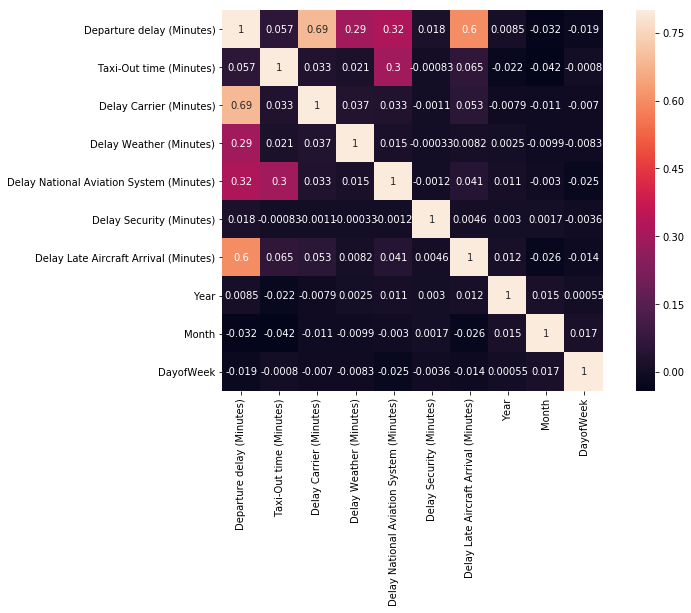

In [15]:
#Correlation matrix shows the relation between the variables
import seaborn as sns
corrmat = training_data_r.corr()
f, ax = plt.subplots(figsize=(12, 7))
sns.heatmap(corrmat, vmax=.8, square=True, annot=True)
plt.show()

#### Cause of flight Delay 

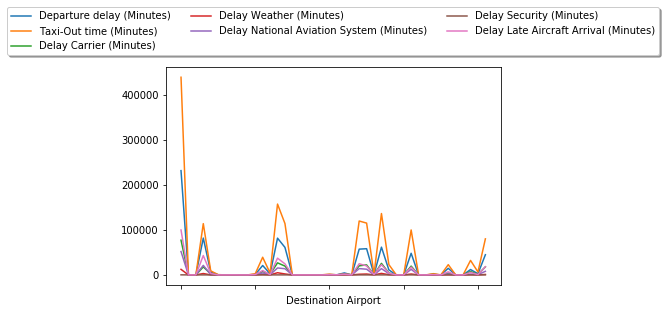

In [16]:
cause_of_d = training_data_r.filter(['Destination Airport','Departure delay (Minutes)','Wheels-off time','Taxi-Out time (Minutes)',
                                   'Delay Carrier (Minutes)','Delay Weather (Minutes)',
                                   'Delay National Aviation System (Minutes)','Delay Security (Minutes)',
                                   'Delay Late Aircraft Arrival (Minutes)'], axis=1)
cause_of_d = training_data_r.groupby('Destination Airport')['Departure delay (Minutes)','Wheels-off time','Taxi-Out time (Minutes)',
                                   'Delay Carrier (Minutes)','Delay Weather (Minutes)',
                                   'Delay National Aviation System (Minutes)','Delay Security (Minutes)',
                                   'Delay Late Aircraft Arrival (Minutes)'].sum().plot()
cause_of_d.legend(loc='upper center', bbox_to_anchor=(0.5, 1.30), ncol=3, fancybox=True, shadow=True)
plt.show()

###### Note:- using this plot i found that maximum delay is caused by Taxi-out time

##### For deep understanding of data, plotting scatter plot for all variables using pairplot

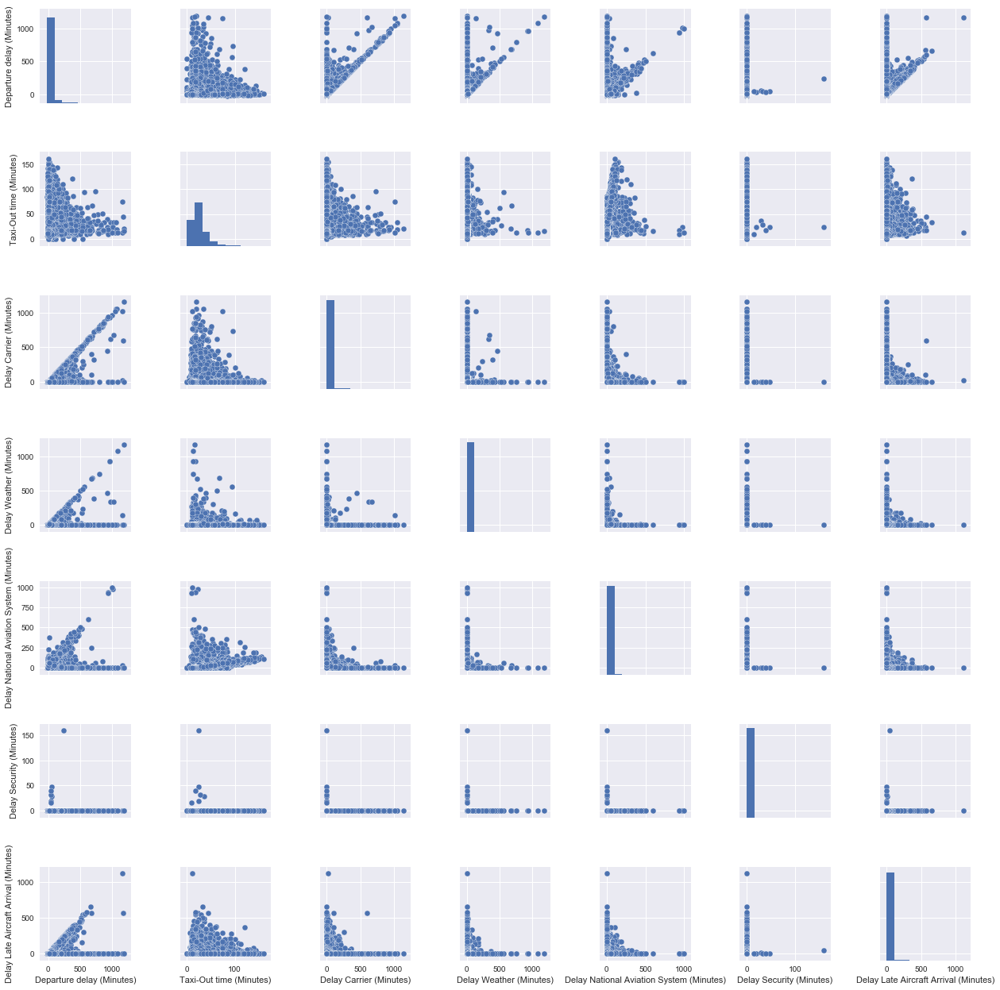

In [17]:
#pairplot shows the regex plot using combination for all the variables
sns.set()
cols = ['Departure delay (Minutes)','Wheels-off time','Taxi-Out time (Minutes)',
                                   'Delay Carrier (Minutes)','Delay Weather (Minutes)',
                                   'Delay National Aviation System (Minutes)','Delay Security (Minutes)',
                                   'Delay Late Aircraft Arrival (Minutes)']
sns.pairplot(training_data_r[cols], size = 2.5)
plt.show()

###### Plotting delay by destination airport

In [18]:
#counting no. of airports
print(training_data_r['Destination Airport'].value_counts())

ATL    18757
DTW     6263
MSP     5470
MCO     4375
BOS     4270
FLL     4116
MIA     4108
PBI     3434
TPA     2808
SLC     1847
DEN     1469
MSY      863
RSW      850
BUF      356
SRQ      196
LGA      170
DFW      166
CVG      119
LAX      103
RDU       97
MKE       66
BZN       21
PIT       11
IAH        8
IND        6
MCI        6
BNA        5
SDF        5
CLE        4
CLT        3
GSO        2
OMA        2
GRR        1
BHM        1
ORF        1
ROC        1
CHS        1
SBN        1
CMH        1
PWM        1
LEX        1
HSV        1
Name: Destination Airport, dtype: int64


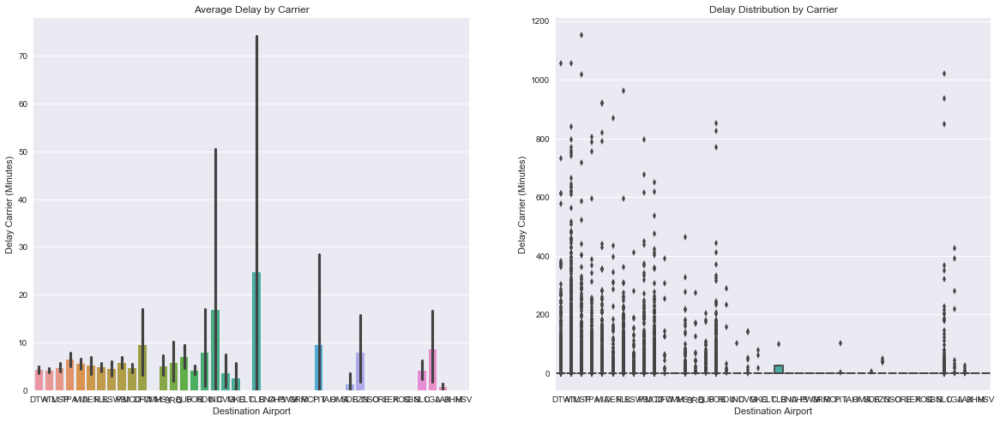

In [19]:
#plotting visualzation for Average delay for all the airports
f,ax=plt.subplots(1,2,figsize=(20,8))
sns.barplot('Destination Airport','Delay Carrier (Minutes)', data=training_data_r,ax=ax[0])         #Avearge Delay
ax[0].set_title('Average Delay by Carrier')                                                         #Title
sns.boxplot('Destination Airport','Delay Carrier (Minutes)', data=training_data_r,ax=ax[1])         #Distrib. by Carrier
ax[1].set_title('Delay Distribution by Carrier')                                                    #Title
plt.close(2)
plt.show()

##### National Aviation System Delay

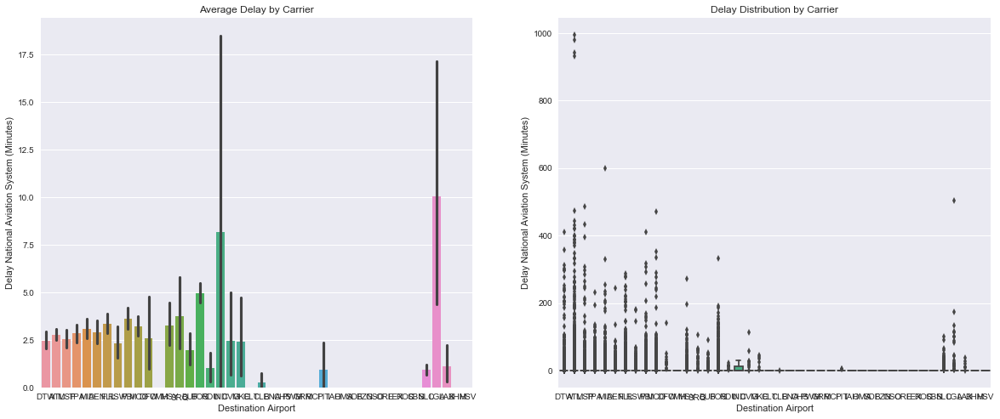

In [20]:
#plotting visualzation for National Aviation System delay for all the airports
f,ax=plt.subplots(1,2,figsize=(20,8))
sns.barplot('Destination Airport','Delay National Aviation System (Minutes)', data=training_data_r,ax=ax[0])
ax[0].set_title('Average Delay by Carrier')
sns.boxplot('Destination Airport','Delay National Aviation System (Minutes)', data=training_data_r,ax=ax[1])
ax[1].set_title('Delay Distribution by Carrier')
plt.close(2)
plt.show()

In [21]:
training_data_r.head(1)

,Carrier Code,Destination Airport,Departure delay (Minutes),Wheels-off time,Taxi-Out time (Minutes),Delay Carrier (Minutes),Delay Weather (Minutes),Delay National Aviation System (Minutes),Delay Security (Minutes),Delay Late Aircraft Arrival (Minutes),Year,Month,DayofWeek
0,DL,DTW,14.0,09:44,25.0,0.0,0.0,0.0,0.0,0.0,2016,1,1


#### Ploting delay by airport using interactive vizualization i.e, plotly(cufflinks)

In [22]:
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
trace = go.Scatter(
    x = training_data_r["Departure delay (Minutes)"],
    y = training_data_r["Destination Airport"],
    mode='markers'
)
layout = go.Layout(
    title='Delay by Destination Airport',
    xaxis=dict(title='Delay'),
    yaxis=dict(title='Airport'),
    showlegend=True    
)
fig = dict(data=[trace],layout=layout)
offline.iplot(fig)

# Model Evaluation Using Linear Regression

C:\Users\codehax41\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



Accuracy :  0.8681338934999631


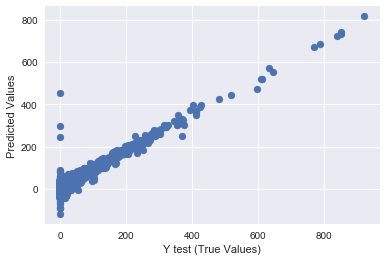

In [23]:
'''
   1.taking x = training data and y = testing data
   2.applying linear regression to the model evaluation
   3.prediction using test data
   4.and cost functions
   
'''
x=training_data_r[['Departure delay (Minutes)','Taxi-Out time (Minutes)','Delay National Aviation System (Minutes)'
                  ,'Delay Security (Minutes)','Delay Weather (Minutes)','Delay Late Aircraft Arrival (Minutes)']]

y=training_data_r['Delay Carrier (Minutes)']

from sklearn import metrics
from sklearn.metrics import accuracy_score, r2_score
from sklearn.cross_validation import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=101)

from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x_train,y_train)

#predicting the test set variables
y_pred = regressor.predict(x_test)
plt.scatter(y_test,y_pred)
plt.xlabel('Y test (True Values)')
plt.ylabel('Predicted Values')
#R2
r_square = metrics.r2_score(y_test,y_pred)
print('Accuracy : ',r_square)

# Model Evaluation Using Random Forest Regressor

In [24]:
from sklearn.ensemble import RandomForestRegressor
RandFor=RandomForestRegressor()
rf_M=RandFor.fit(x_train,y_train)
rf_M.score(x_train,y_train)
rf_M_y_prediction=rf_M.predict(x_test)
r2_score(y_test,rf_M_y_prediction)
print('Accuracy : ',r2_score(y_test,rf_M_y_prediction))

Accuracy :  0.9015108840442791


# Model Evaluation Using Decision Tree Regressor

In [25]:
from sklearn.tree import DecisionTreeRegressor
DecTree=DecisionTreeRegressor()
dt_M=DecTree.fit(x_train,y_train)
dt_M.score(x_train,y_train)
dt_M_y_prediction=dt_M.predict(x_test)
print('Accuracy : ',r2_score(y_test,dt_M_y_prediction))

Accuracy :  0.8894372097426744


# Model Evaluation Using Support Vector regressor

C:\Users\codehax41\Anaconda3\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



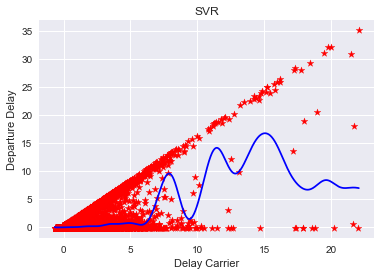

In [30]:
X = training_data_r['Departure delay (Minutes)'].values
y = training_data_r['Delay Carrier (Minutes)'].values
X=X.reshape(-1,1)
y=y.reshape(-1,1)
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(y)

# Fitting SVR to the dataset
from sklearn.svm import SVR
regressor = SVR(kernel = 'rbf')
regressor.fit(X, y)
 
# Visualising the SVR results (for higher resolution and smoother curve)
X_grid = np.arange(min(X), max(X), 0.01) 
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, y, color = 'red',marker='*',s=50,label='data')
plt.plot(X_grid, regressor.predict(X_grid), color = 'blue')
plt.title('SVR')
plt.xlabel('Delay Carrier')
plt.ylabel('Departure Delay')
plt.show()

# Cross Entropy Score

In [27]:
from sklearn.tree import DecisionTreeClassifier 
clf_gini = DecisionTreeClassifier(criterion = "gini",random_state = 100,max_depth=3, min_samples_leaf=5)
clf_entropy = DecisionTreeClassifier( criterion = "entropy", random_state = 100,  max_depth = 3, min_samples_leaf = 5)
clf_gini.fit(x_train, y_train)
clf_entropy.fit(x_train, y_train)
print('Accuracy : ',clf_entropy.score(x_train, y_train))

Accuracy :  0.9020242914979757


# Evolution Matrix

In [28]:
#Evolution matrix
from sklearn import metrics
print('\nMAE:',metrics.mean_absolute_error(y_true=y_test,y_pred=y_pred))
print('\nMSE:',metrics.mean_squared_error(y_true=y_test,y_pred=y_pred))
print('\nRMSE:',np.sqrt(metrics.mean_squared_error(y_true=y_test,y_pred=y_pred)))


MAE: 6.745345527139326

MSE: 121.79845114132914

RMSE: 11.036233557755523


# Conclusion

#### Random Forest Regressor is the best regressor modol for this dataset

###### These dataset was two-fold train and test. The first part deal with an exploration of the dataset, with the aim of understanding some properties of the delays registered by flights. This exploration gave me the occasion of using various vizualization tools offered by python. The second part of the notebook consisted in the elaboration of a model aimed at predicting flight delays. For that purpose, I used Machine Learning regression modules and showed the importance of regularisation techniques. In fact, Random Forest gives the best accuracy then linear regression, cross entropy, decison tree models for prediction of delays.